## Environment set up and import Libraries

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# import tensorflow as tf
# device_name = tf.test.gpu_device_name()
# with tf.device(device_name):
#   print(device_name.split(":")[1]," running . . . ")

GPU  running . . . 


In [ ]:
import tensorflow as tf
import os,sys
import numpy as np
import random

random.seed(1)
np.random.seed(1)
tf.random.set_seed(2)

In [ ]:
import os, keras, numpy,tensorflow
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from numpy import *
from numpy.random import *
from keras.datasets.fashion_mnist import load_data
from keras.datasets import mnist
from tensorflow.keras.optimizers import Adam
from keras.models import Model
from keras.layers import *
from tensorflow.keras import initializers

## **Discriminator** Model

In [ ]:
def define_discriminator(in_shape=(128,128,3),n_classes=7):

    # input level
    label_layer_1 = Input(shape=(1,), name = "Input_Label")
    label_layer_2 = Embedding(n_classes, 100, name="Embedding_Layer")(label_layer_1)
    label_layer_3 = Dense(in_shape[0] * in_shape[1], name="Dense_Layer_1")(label_layer_2)
    label_layer_4 = Reshape((in_shape[0], in_shape[1], 1), name="Reshape_Layer_1")(label_layer_3)
    # (128, 128, 1)

    # input image
    input_image = Input(shape=in_shape, name = "Input_Image")
    # (128, 128, 3)

    concat_layer = Concatenate(name = "Concatenation_Layer")([input_image, label_layer_4])
    # (128, 128, 4)

    conv2d_layer_1 = Conv2D(filters = 16, kernel_size = (3,3), strides = (2,2), padding='same', name="Convolution_Layer_1")(concat_layer)
    conv2d_layer_1 = LeakyReLU(alpha=0.3, name="LeakyReLU_Layer_1")(conv2d_layer_1)
    # (64, 64, 16)

    conv2d_layer_2 = Conv2D(filters = 32, kernel_size = (3,3), strides = (2,2), padding = 'same', name="Convolution_Layer_2")(conv2d_layer_1)
    conv2d_layer_2 = LeakyReLU(alpha=0.3, name="LeakyReLU_Layer_2")(conv2d_layer_2)
    # (32, 32, 32)

    conv2d_layer_3 = Conv2D(filters = 64, kernel_size = (3,3),  strides = (2,2), padding = 'same', name="Convolution_Layer_3")(conv2d_layer_2)
    conv2d_layer_3 = LeakyReLU(alpha=0.3, name="LeakyReLU_Layer_3")(conv2d_layer_3)
    # (16, 16, 64)

    conv2d_layer_4 = Conv2D(filters = 64, kernel_size = (3,3), strides = (2,2), padding = 'same', name="Convolution_Layer_4")(conv2d_layer_3)
    conv2d_layer_4 = LeakyReLU(alpha=0.3, name="LeakyReLU_Layer_4")(conv2d_layer_4)
    # (8, 8, 64)

    conv2d_layer_5 = Conv2D(filters = 64, kernel_size = (3,3), strides = (2,2), padding = 'same', name="Convolution_Layer_5")(conv2d_layer_4)
    conv2d_layer_5 = LeakyReLU(alpha=0.3, name="LeakyReLU_Layer_5")(conv2d_layer_5)
    # (8, 8, 64)

    flatten_layer = Flatten(name="Flatten_Layer")(conv2d_layer_5)
    # (4 * 4 * 64)

    dropout_layer = Dropout(rate=0.4, name="Dropout_Layer")(flatten_layer)
    # (4 * 4 * 64)

    dense_layer = Dense(128*8, activation='relu', name="Dense_Layer_2")(dropout_layer)
    # (8 * 128)

    # final layer
    output_layer = Dense(1, activation='sigmoid', name="Dense_Layer_3")(dense_layer)
    # (1,)

    model = Model([input_image,label_layer_1], output_layer)

    opt = Adam(learning_rate= 3e-4, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

a = define_discriminator()
a.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Label (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Embedding_Layer (Embedding)    (None, 1, 100)       700         ['Input_Label[0][0]']            
                                                                                                  
 Dense_Layer_1 (Dense)          (None, 1, 16384)     1654784     ['Embedding_Layer[0][0]']        
                                                                                                  
 Input_Image (InputLayer)       [(None, 128, 128, 3  0           []                               
                                )]                                                          

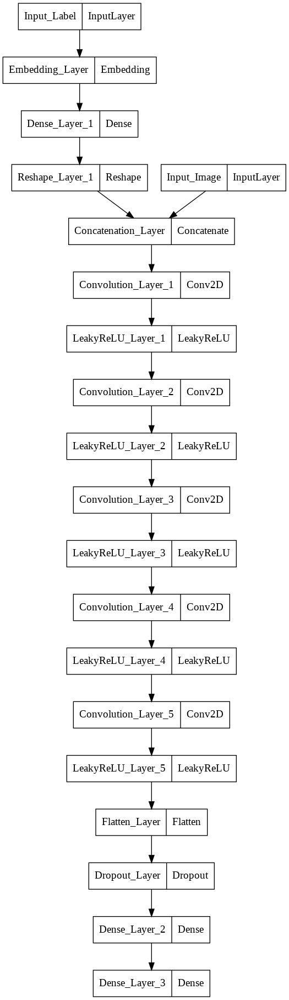

In [ ]:
# plot the discriminator model
tf.keras.utils.plot_model(a)

## **Generator** Model

In [ ]:
def define_generator(latent_dim = 100, n_classes = 7):

    # input level
    label_layer_1 = Input(shape=(1,), name = "Input_Label")
    label_layer_2 = Embedding(n_classes, 100, name="Embedding_Layer")(label_layer_1)
    label_layer_3 = Dense(8 * 8, name="Dense_Layer_1")(label_layer_2)
    label_layer_4 = Reshape((8, 8, 1), name="Reshape_Layer_1")(label_layer_3)
    # (8, 8, 1)

    # latent input
    latent_layer = Input(shape=(latent_dim,), name = "Input_Latent")

    layer_2 = Dense(128 * 8 * 8,activation="relu", name="Dense_Layer_2")(latent_layer)
    # layer_2 = Activation("relu")(layer_2)
    layer_2 = Reshape((8, 8, 128), name="Reshape_Layer_2")(layer_2)
    layer_2_1 = BatchNormalization(momentum = 0.8, name="Batchnormalization_Layer_1")(layer_2)
    # (8, 8, 128)


    concat_layer_1 = Concatenate(name="Concatenation_Layer")([layer_2_1, label_layer_4])
    # (8, 8, 129)

    layer_3 = Conv2DTranspose(filters = 128, kernel_size = (3,3), strides=(2,2), padding='same', name="Convolution_Transpose_Layer_1")(concat_layer_1)
    layer_3 = Conv2D(filters = 128, kernel_size = (3,3), padding='same', kernel_initializer = initializers.RandomNormal(0,0.8), name="Convolution_Layer_1")(layer_3)
    layer_3 = BatchNormalization(momentum = 0.8, name="Batchnormalization_Layer_2")(layer_3)
    layer_3 = LeakyReLU(alpha=0.4, name="LeakyReLU_Layer_1")(layer_3)
    # (16, 16, 128)

    layer_4 = Conv2DTranspose(filters = 128, kernel_size = (3,3), strides=(2,2), padding='same', name="Convolution_Transpose_Layer_2")(layer_3)
    layer_4 = Conv2D(filters = 128, kernel_size = (3,3), padding='same',kernel_initializer = initializers.RandomNormal(0,0.8), name="Convolution_Layer_2")(layer_4)
    layer_4 = BatchNormalization(momentum = 0.8, name="Batchnormalization_Layer_3")(layer_4)
    layer_4 = LeakyReLU(alpha=0.4, name="LeakyReLU_Layer_2")(layer_4)
    # (32, 32, 128)

    layer_5 = Conv2DTranspose(filters = 128, kernel_size = (3,3), strides=(2,2), padding='same', name="Convolution_Transpose_Layer_3")(layer_4)
    layer_5 = Conv2D(filters = 128, kernel_size = (3,3), padding='same',kernel_initializer = initializers.RandomNormal(0,0.8), name="Convolution_Layer_3")(layer_5)
    layer_5 = BatchNormalization(momentum = 0.8, name="Batchnormalization_Layer_4")(layer_5)
    layer_5 = LeakyReLU(alpha=0.4, name="LeakyReLU_Layer_3")(layer_5)
    # (64, 64, 128)

    layer_6 = Conv2DTranspose(filters = 128, kernel_size = (3,3), strides=(2,2), padding='same', name="Convolution_Transpose_Layer_4")(layer_5)
    layer_6 = Conv2D(filters = 128, kernel_size = (3,3), padding='same',kernel_initializer = initializers.RandomNormal(0,0.8), name="Convolution_Layer_4")(layer_6)
    layer_6 = BatchNormalization(momentum = 0.8, name="Batchnormalization_Layer_5")(layer_6)
    layer_6 = LeakyReLU(alpha=0.4, name="LeakyReLU_Layer_4")(layer_6)
    # (128, 128, 256)

    # final layer
    output_layer = Conv2D(filters = 3, kernel_size = (3,3), strides=(1,1), activation='tanh', padding='same', name="Convolution_Layer_5")(layer_6)

    model = Model([latent_layer,label_layer_1], output_layer)
    return model

b = define_generator(512)
b.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Latent (InputLayer)      [(None, 512)]        0           []                               
                                                                                                  
 Input_Label (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Dense_Layer_2 (Dense)          (None, 8192)         4202496     ['Input_Latent[0][0]']           
                                                                                                  
 Embedding_Layer (Embedding)    (None, 1, 100)       700         ['Input_Label[0][0]']            
                                                                                            

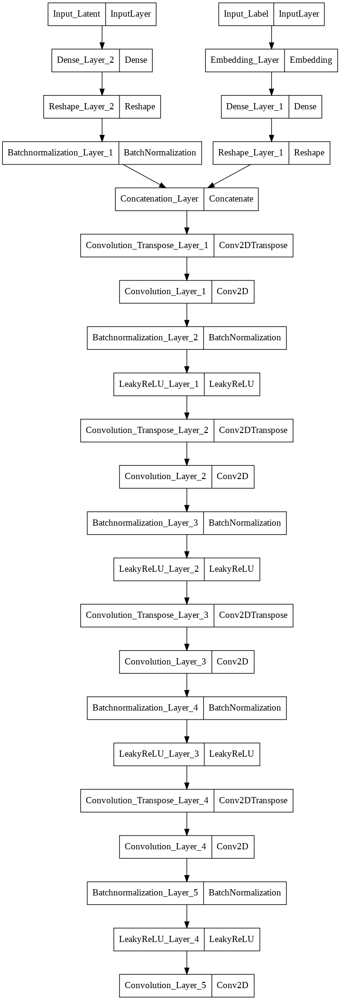

In [ ]:
# plot the generator model
tf.keras.utils.plot_model(b)

## **Combine** or **GAN** Model

In [ ]:
def define_gan(g_model, d_model):

  d_model.trainable = False

  g_latent, g_label = g_model.input
  g_output = g_model.output

  d_output = d_model([g_output,g_label])

  model = Model([g_latent, g_label], d_output)

  opt = Adam(learning_rate= 3e-4, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt,  metrics=['accuracy'])
  
  return model
c = define_gan(b, a)
c.summary()

Model: "model_17"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_latent (InputLayer)      [(None, 512)]        0           []                               
                                                                                                  
 dense_29 (Dense)               (None, 8192)         4202496     ['input_latent[0][0]']           
                                                                                                  
 input_label (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 activation_5 (Activation)      (None, 8192)         0           ['dense_29[0][0]']               
                                                                                           

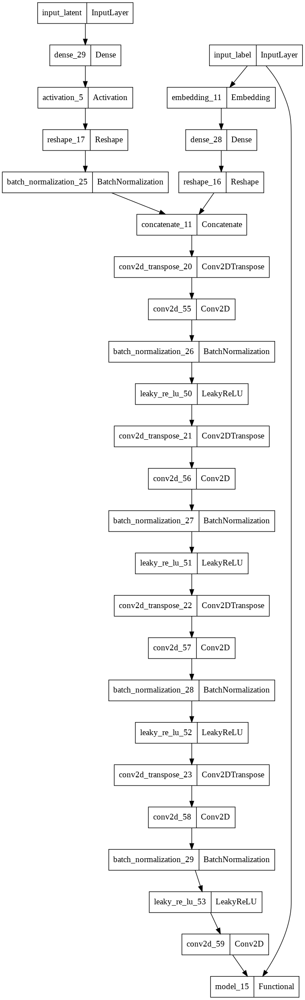

In [ ]:
# plot GAN model
tf.keras.utils.plot_model(c)

## Load Dataset

In [ ]:
def load_real_samples():
  # load dataset
  data = np.load("/content/drive/MyDrive/GAN_New_Approch/1/celeb_dataset_128.npz")
  data = data['arr_0']
  data = np.array(data)
  X = data.astype('float32')
  # scale from [0,255] to [-1,1]
  X = (X - 127.5) / 127.5
  return X
# k = load_real_samples()
# print("image: ",k.shape)
# print("\nshape/size of the first 16 data: ",k[:16].shape)

image:  (10000, 128, 128, 3)

shape/size of the first 16 data:  (16, 128, 128, 3)


## Plot data with label

## Plot data with label

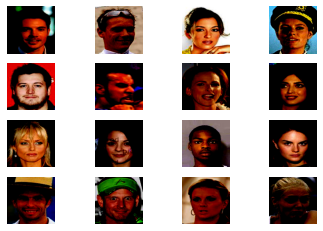

In [ ]:
def save_plot(x_input,n=4):
    for i in range(n*n):
        plt.subplot(n, n, i+1)
        plt.imshow(x_input[i,:,:,:])
        plt.axis('off')
    plt.show()
# plot data
# save_plot(k[:16])

## Generate real sample function

In [ ]:
def generate_real_samples(dataset, n_samples):
	images = dataset
	ix = randint(0, images.shape[0], n_samples)
	X = images[ix]
	z = np.random.randint(0,7,size=(n_samples))
	y = ones((n_samples, 1))
	return [X,z], y
# d = generate_real_samples(k, 32)
# print("Generate real data as a batch randomly: ",d[0][0].shape)

Generate real data as a batch randomly:  (32, 128, 128, 3)


## Generate latent point function

In [ ]:
def generate_latent_points(latent_dim, n_samples):
  x_input = randn(latent_dim * n_samples)
  z_input = x_input.reshape(n_samples, latent_dim)
  z = np.random.randint(0,7,size=(n_samples))
  return [z_input,z]
# p = generate_latent_points(512, 32)
# print("Generate latent point(with label) as a batch: ",p[0].shape)

Generate latent point(with label) as a batch:  (32, 512)


## Generate Fake samples of image with label

In [ ]:
def generate_fake_samples(generator, latent_dim, n_samples):
	z_input,z = generate_latent_points(latent_dim, n_samples)
	images = generator.predict([z_input,z])
	y = zeros((n_samples, 1))
	return [images, z], y
# with tf.device(device_name):
	# kh = generate_fake_samples(b, 512, 32)
	# print("shape of the generated images: ",kh[0][0].shape)

shape of the generated images:  (32, 128, 128, 3)


## Summarize the generator model

In [ ]:
def summarize_the_model(generator,latent_dim = 100):
    latent_points = generate_latent_points(latent_dim= latent_dim, n_samples= 16)
    X  = generator.predict(latent_points)
    # scale from [-1,1] to [0,1]
    # X = (X + 1) / 2.0
    save_plot(X, n=4)

In [ ]:
def save_figure(generator,a,latent_dim = 512,n=4):
    latent_points, labels = generate_latent_points(latent_dim= latent_dim, n_samples= 16)
    X  = generator.predict([latent_points, labels])
    # plt.title("Epoch_"+str(a+1),loc = "center")
    for j in range(n*n):
        plt.subplot(n, n, j+1)
        plt.imshow(X[j,:,:,:])
        plt.axis('off')
    plt.suptitle("Epoch_"+str(a+1))
    plt.savefig("/content/drive/MyDrive/GAN_New_Approch/1/epoch_"+str(a+1))

## Train function

In [ ]:
def train(g_model, d_model, gan_model, dataset, latent_dim= 100, n_epochs=3, n_batch=128):

  print("No. of epoch: ",n_epochs)
  bat_per_epo = int(dataset.shape[0] / n_batch)
  print("batch per epoch: ", bat_per_epo)
  print("full batch: ",n_batch)
  half_batch = int(n_batch / 2)
  print("half batch: ", half_batch,'\n')
  print("*"*50,'\n\n')

  d_loss_real_array,d_loss_fake_array =[],[]
  g_loss_array = []
  for i in range(n_epochs):
    d_loss_r,d_loss_f = 0.0,0.0
    g_loss = 0.0
    
    for j in range(bat_per_epo):

      [X_real, labels_real], y_real = generate_real_samples(dataset, half_batch)
      d_loss1, _ = d_model.train_on_batch([X_real, labels_real], y_real)
      d_loss_r += d_loss1
      # print("real_loss")

      [X_fake, labels], y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
      d_loss2, _ = d_model.train_on_batch([X_fake, labels], y_fake)
      d_loss_f += d_loss2
      # print("fake_loss")

      [z_input, labels_input] = generate_latent_points(latent_dim, n_batch)
      y_gan = ones((n_batch, 1))
      g_loss1,_ = gan_model.train_on_batch([z_input, labels_input], y_gan)
      g_loss += g_loss1

    d_loss_real_array.append(d_loss_r)
    d_loss_fake_array.append(d_loss_f)
    g_loss_array.append(g_loss)

    print('epoch -> [%d/%d], discriminator_loss_for_real_data = %.2f, discriminator_loss_for_fake_data = %.2f, generator_loss = %.2f\n' %(i+1, n_epochs, d_loss_r, d_loss_f, g_loss))
    summarize_the_model(g_model,latent_dim)
    # g_model.save("g_gan_model_"+str(i)+".h5")
    g_model.save("/content/drive/MyDrive/GAN_New_Approch/1/generator_model_2.h5")
    np.savez_compressed('/content/drive/MyDrive/GAN_New_Approch/1/loss_record_2.npz', a=d_loss_real_array, b=d_loss_fake_array, c=g_loss_array)
    save_figure(g_model,i,latent_dim = 512,n=4)

    print("\n")

  return d_loss_real_array, d_loss_fake_array, g_loss_array

## Main function


READY TO GO !!!

No. of epoch:  150
batch per epoch:  312
full batch:  32
half batch:  16 

************************************************** 




epoch -> [1/150], discriminator_loss_for_real_data = 168.02, discriminator_loss_for_fake_data = 167.23, generator_loss = 596.36



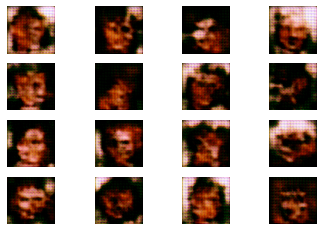

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  This is separate from the ipykernel package so we can avoid doing imports until


epoch -> [2/150], discriminator_loss_for_real_data = 208.69, discriminator_loss_for_fake_data = 216.48, generator_loss = 245.61



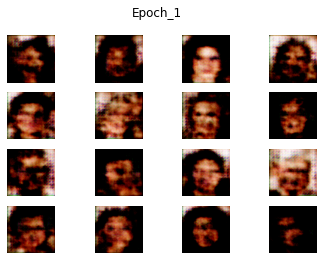

epoch -> [3/150], discriminator_loss_for_real_data = 210.80, discriminator_loss_for_fake_data = 210.08, generator_loss = 253.05



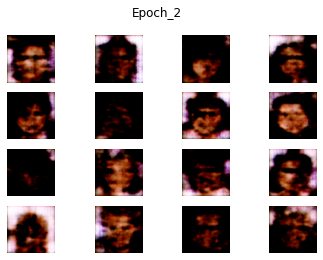

epoch -> [4/150], discriminator_loss_for_real_data = 215.50, discriminator_loss_for_fake_data = 214.91, generator_loss = 226.36



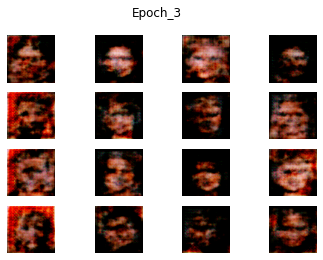

epoch -> [5/150], discriminator_loss_for_real_data = 215.83, discriminator_loss_for_fake_data = 214.88, generator_loss = 225.53



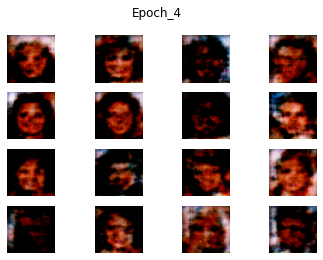

epoch -> [6/150], discriminator_loss_for_real_data = 213.60, discriminator_loss_for_fake_data = 217.05, generator_loss = 221.63



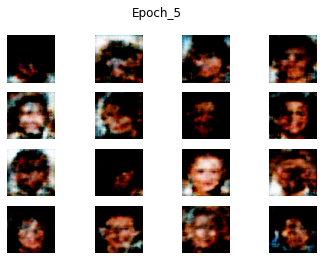

epoch -> [7/150], discriminator_loss_for_real_data = 211.42, discriminator_loss_for_fake_data = 216.78, generator_loss = 228.10



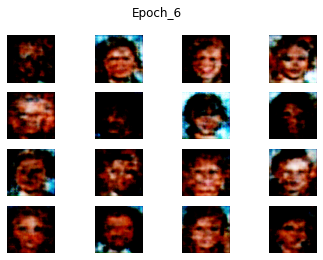

epoch -> [8/150], discriminator_loss_for_real_data = 209.94, discriminator_loss_for_fake_data = 214.29, generator_loss = 244.27



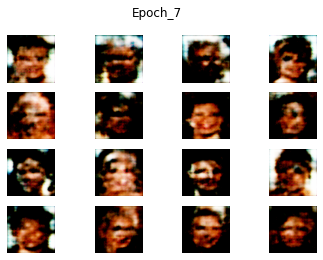

epoch -> [9/150], discriminator_loss_for_real_data = 198.58, discriminator_loss_for_fake_data = 208.04, generator_loss = 259.84



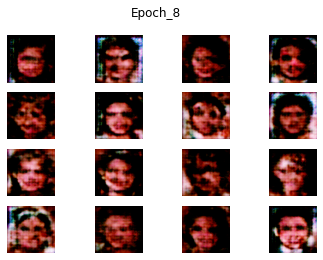

epoch -> [10/150], discriminator_loss_for_real_data = 209.76, discriminator_loss_for_fake_data = 212.05, generator_loss = 239.82



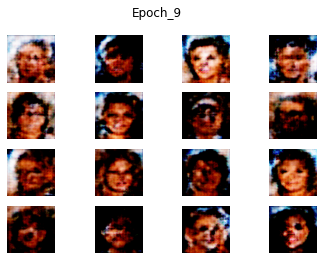

epoch -> [11/150], discriminator_loss_for_real_data = 206.79, discriminator_loss_for_fake_data = 214.53, generator_loss = 233.98



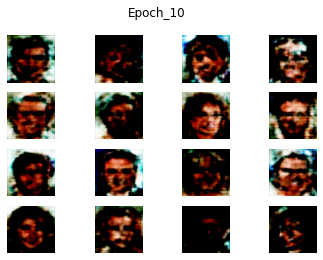

epoch -> [12/150], discriminator_loss_for_real_data = 208.67, discriminator_loss_for_fake_data = 213.55, generator_loss = 237.09



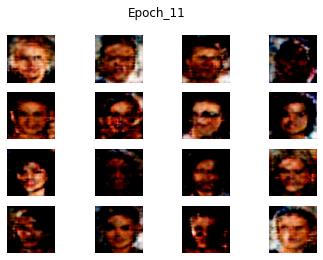

epoch -> [13/150], discriminator_loss_for_real_data = 205.34, discriminator_loss_for_fake_data = 214.70, generator_loss = 232.72



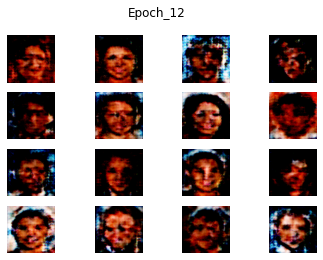

epoch -> [14/150], discriminator_loss_for_real_data = 191.83, discriminator_loss_for_fake_data = 213.85, generator_loss = 246.15



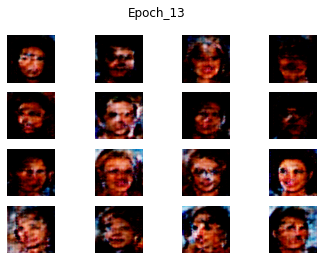

epoch -> [15/150], discriminator_loss_for_real_data = 189.77, discriminator_loss_for_fake_data = 207.48, generator_loss = 263.80



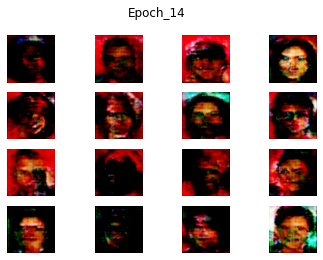

epoch -> [16/150], discriminator_loss_for_real_data = 190.31, discriminator_loss_for_fake_data = 203.60, generator_loss = 270.84



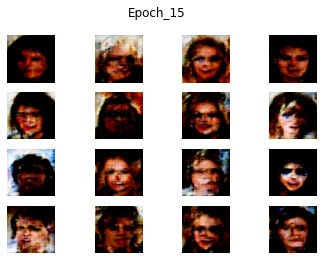

epoch -> [17/150], discriminator_loss_for_real_data = 186.39, discriminator_loss_for_fake_data = 199.70, generator_loss = 280.02



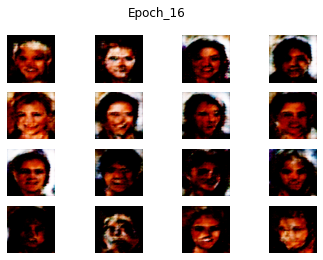

epoch -> [18/150], discriminator_loss_for_real_data = 177.31, discriminator_loss_for_fake_data = 184.20, generator_loss = 327.39



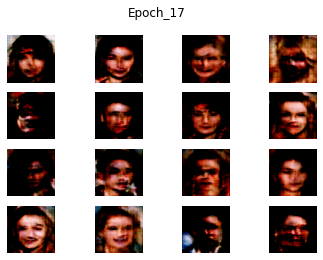

epoch -> [19/150], discriminator_loss_for_real_data = 189.66, discriminator_loss_for_fake_data = 195.78, generator_loss = 285.12



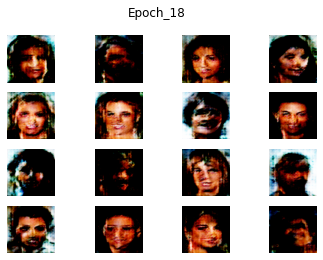

epoch -> [20/150], discriminator_loss_for_real_data = 175.09, discriminator_loss_for_fake_data = 182.08, generator_loss = 338.36



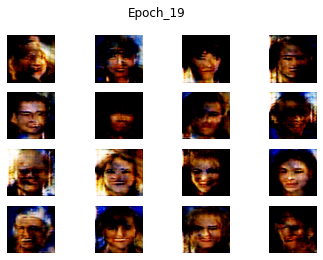

epoch -> [21/150], discriminator_loss_for_real_data = 185.12, discriminator_loss_for_fake_data = 191.91, generator_loss = 307.53



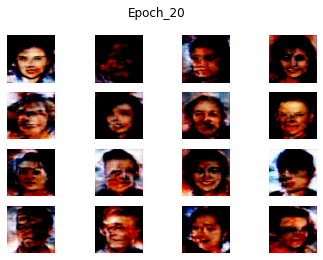

epoch -> [22/150], discriminator_loss_for_real_data = 187.56, discriminator_loss_for_fake_data = 193.51, generator_loss = 287.89



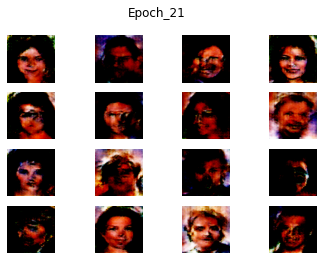

epoch -> [23/150], discriminator_loss_for_real_data = 183.49, discriminator_loss_for_fake_data = 193.32, generator_loss = 302.55



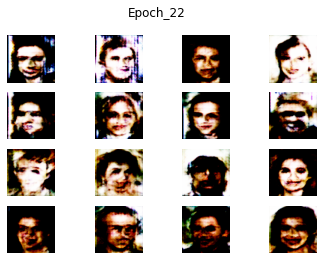

epoch -> [24/150], discriminator_loss_for_real_data = 176.91, discriminator_loss_for_fake_data = 182.02, generator_loss = 328.85



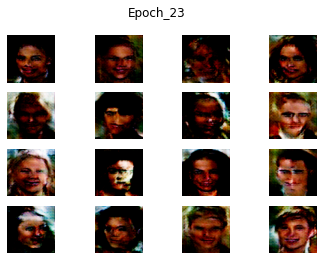

epoch -> [25/150], discriminator_loss_for_real_data = 183.02, discriminator_loss_for_fake_data = 187.19, generator_loss = 306.15



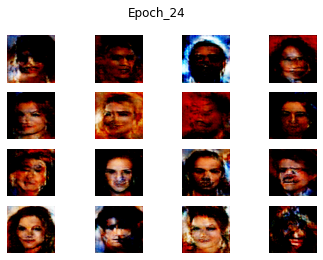

epoch -> [26/150], discriminator_loss_for_real_data = 180.66, discriminator_loss_for_fake_data = 186.70, generator_loss = 311.83



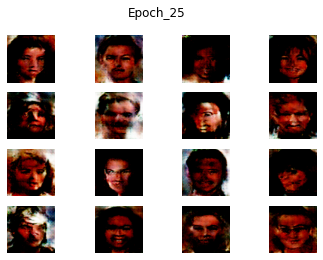

epoch -> [27/150], discriminator_loss_for_real_data = 179.79, discriminator_loss_for_fake_data = 185.55, generator_loss = 317.69



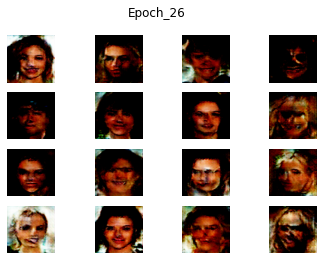

epoch -> [28/150], discriminator_loss_for_real_data = 178.09, discriminator_loss_for_fake_data = 183.26, generator_loss = 326.83



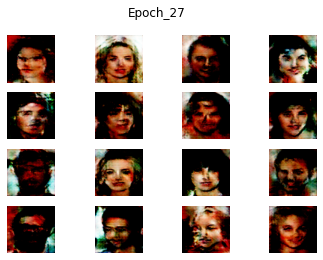

epoch -> [29/150], discriminator_loss_for_real_data = 179.82, discriminator_loss_for_fake_data = 185.14, generator_loss = 325.25



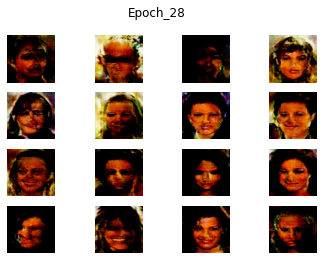

epoch -> [30/150], discriminator_loss_for_real_data = 173.19, discriminator_loss_for_fake_data = 182.81, generator_loss = 330.68



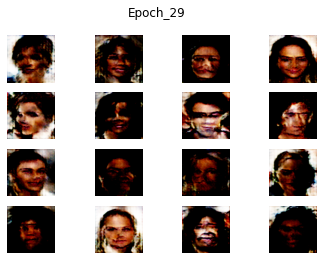

epoch -> [31/150], discriminator_loss_for_real_data = 174.08, discriminator_loss_for_fake_data = 179.09, generator_loss = 337.28



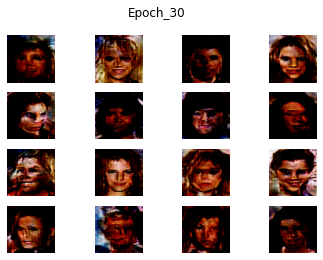

epoch -> [32/150], discriminator_loss_for_real_data = 167.56, discriminator_loss_for_fake_data = 173.59, generator_loss = 357.86



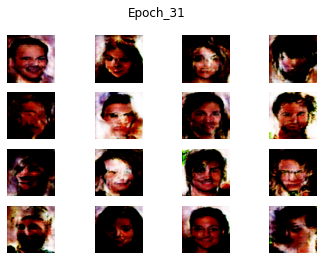

epoch -> [33/150], discriminator_loss_for_real_data = 166.42, discriminator_loss_for_fake_data = 169.81, generator_loss = 373.19



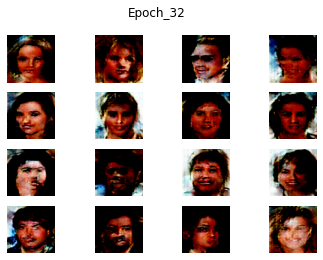

epoch -> [34/150], discriminator_loss_for_real_data = 165.47, discriminator_loss_for_fake_data = 168.30, generator_loss = 366.47



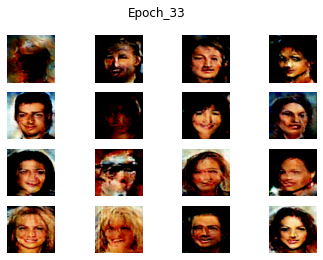

epoch -> [35/150], discriminator_loss_for_real_data = 164.50, discriminator_loss_for_fake_data = 170.02, generator_loss = 367.84



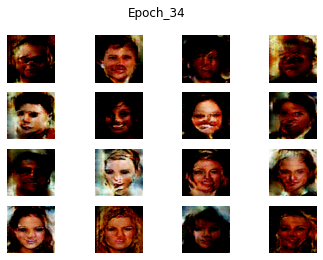

epoch -> [36/150], discriminator_loss_for_real_data = 163.04, discriminator_loss_for_fake_data = 165.47, generator_loss = 387.36



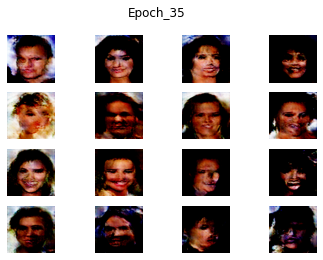

epoch -> [37/150], discriminator_loss_for_real_data = 161.56, discriminator_loss_for_fake_data = 165.96, generator_loss = 380.93



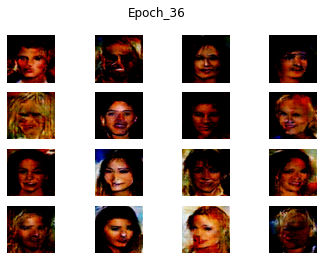

epoch -> [38/150], discriminator_loss_for_real_data = 164.04, discriminator_loss_for_fake_data = 166.49, generator_loss = 385.66



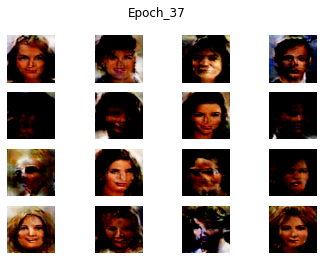

epoch -> [39/150], discriminator_loss_for_real_data = 156.79, discriminator_loss_for_fake_data = 161.69, generator_loss = 397.70



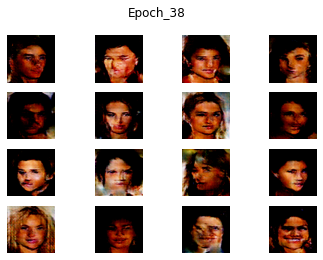

epoch -> [40/150], discriminator_loss_for_real_data = 157.47, discriminator_loss_for_fake_data = 159.91, generator_loss = 406.30



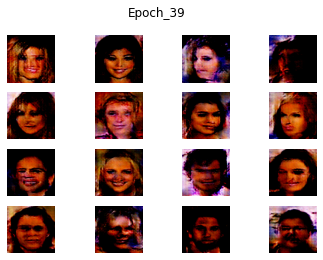

epoch -> [41/150], discriminator_loss_for_real_data = 154.34, discriminator_loss_for_fake_data = 158.33, generator_loss = 413.32



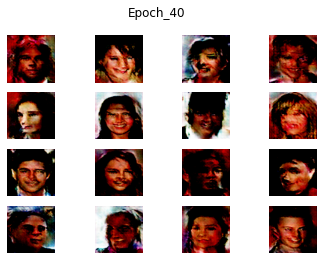

epoch -> [42/150], discriminator_loss_for_real_data = 152.74, discriminator_loss_for_fake_data = 155.82, generator_loss = 406.17



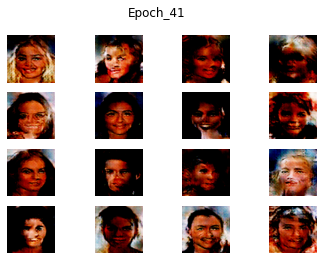

epoch -> [43/150], discriminator_loss_for_real_data = 141.45, discriminator_loss_for_fake_data = 142.71, generator_loss = 479.61



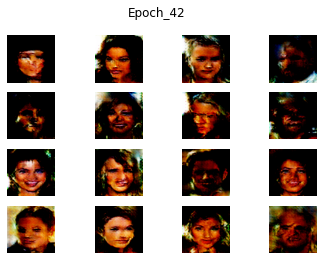

epoch -> [44/150], discriminator_loss_for_real_data = 147.98, discriminator_loss_for_fake_data = 153.24, generator_loss = 448.96



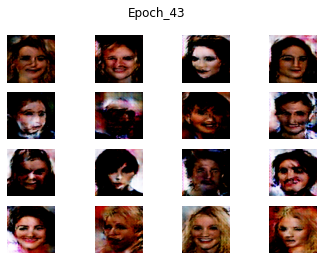

epoch -> [45/150], discriminator_loss_for_real_data = 143.95, discriminator_loss_for_fake_data = 146.12, generator_loss = 458.31



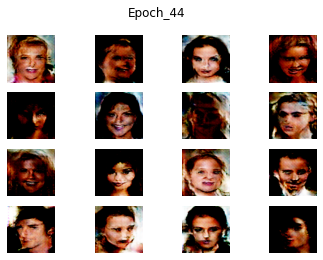

epoch -> [46/150], discriminator_loss_for_real_data = 145.56, discriminator_loss_for_fake_data = 147.90, generator_loss = 443.75



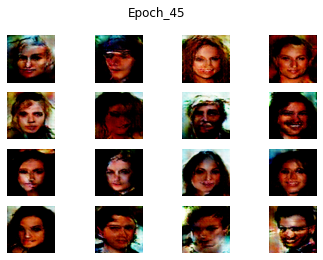

epoch -> [47/150], discriminator_loss_for_real_data = 140.33, discriminator_loss_for_fake_data = 144.51, generator_loss = 454.63



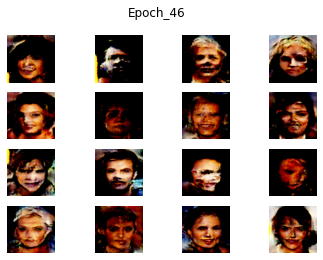

epoch -> [48/150], discriminator_loss_for_real_data = 140.58, discriminator_loss_for_fake_data = 144.96, generator_loss = 477.79



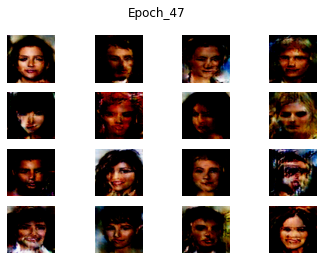

epoch -> [49/150], discriminator_loss_for_real_data = 144.69, discriminator_loss_for_fake_data = 149.50, generator_loss = 461.53



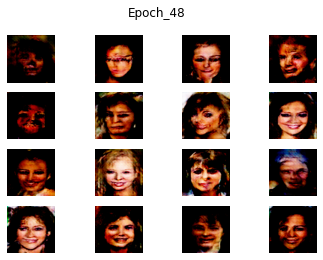

epoch -> [50/150], discriminator_loss_for_real_data = 145.18, discriminator_loss_for_fake_data = 147.86, generator_loss = 456.55



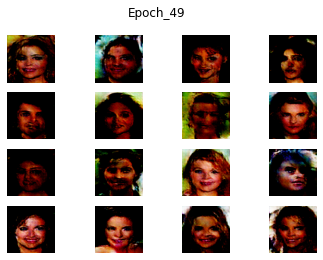

epoch -> [51/150], discriminator_loss_for_real_data = 143.31, discriminator_loss_for_fake_data = 144.00, generator_loss = 459.36



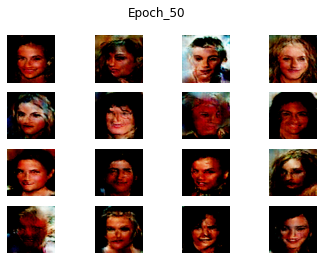

epoch -> [52/150], discriminator_loss_for_real_data = 138.65, discriminator_loss_for_fake_data = 140.29, generator_loss = 477.57



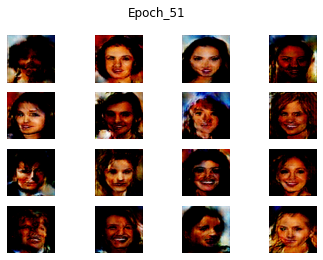

epoch -> [53/150], discriminator_loss_for_real_data = 136.16, discriminator_loss_for_fake_data = 140.37, generator_loss = 489.46



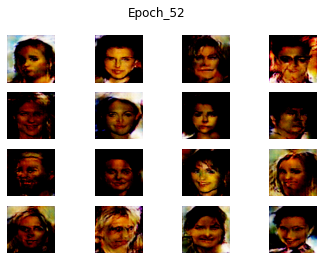

epoch -> [54/150], discriminator_loss_for_real_data = 137.29, discriminator_loss_for_fake_data = 140.26, generator_loss = 489.78



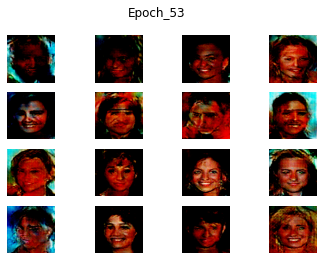

epoch -> [55/150], discriminator_loss_for_real_data = 135.70, discriminator_loss_for_fake_data = 138.53, generator_loss = 492.29



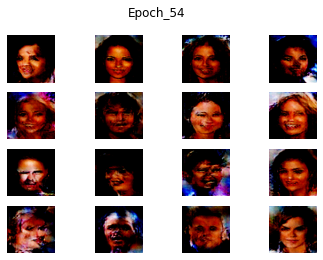

epoch -> [56/150], discriminator_loss_for_real_data = 135.17, discriminator_loss_for_fake_data = 138.65, generator_loss = 487.05



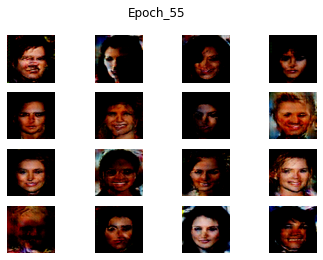

epoch -> [57/150], discriminator_loss_for_real_data = 131.59, discriminator_loss_for_fake_data = 135.98, generator_loss = 510.58



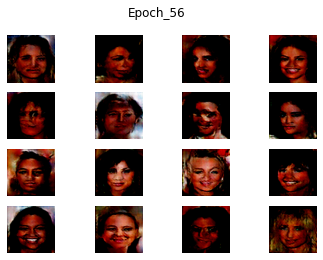

epoch -> [58/150], discriminator_loss_for_real_data = 131.80, discriminator_loss_for_fake_data = 133.14, generator_loss = 509.93



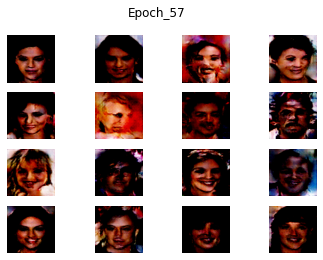

epoch -> [59/150], discriminator_loss_for_real_data = 124.83, discriminator_loss_for_fake_data = 130.68, generator_loss = 539.89



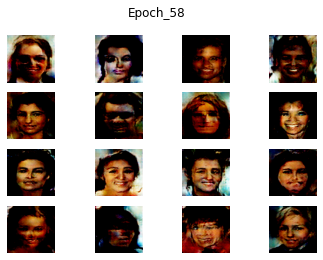

epoch -> [60/150], discriminator_loss_for_real_data = 126.15, discriminator_loss_for_fake_data = 129.84, generator_loss = 524.82



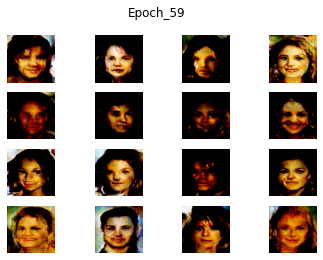

epoch -> [61/150], discriminator_loss_for_real_data = 122.69, discriminator_loss_for_fake_data = 130.28, generator_loss = 556.55



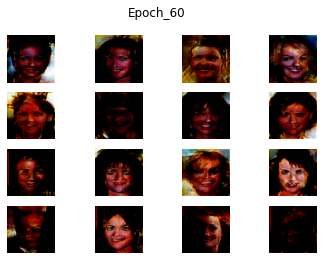

epoch -> [62/150], discriminator_loss_for_real_data = 128.34, discriminator_loss_for_fake_data = 131.89, generator_loss = 557.64



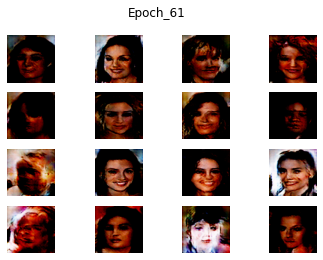

epoch -> [63/150], discriminator_loss_for_real_data = 126.92, discriminator_loss_for_fake_data = 127.18, generator_loss = 547.90



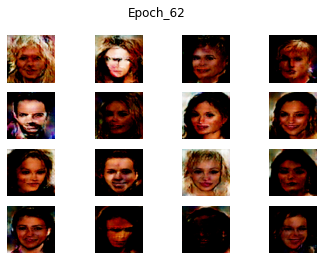

epoch -> [64/150], discriminator_loss_for_real_data = 120.92, discriminator_loss_for_fake_data = 124.61, generator_loss = 556.36



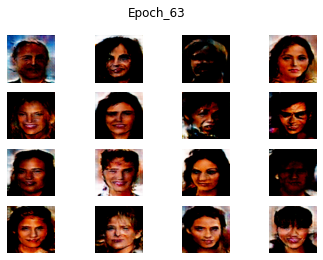

epoch -> [65/150], discriminator_loss_for_real_data = 118.13, discriminator_loss_for_fake_data = 120.51, generator_loss = 576.21



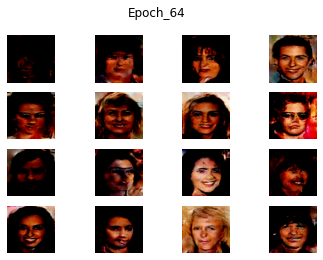

epoch -> [66/150], discriminator_loss_for_real_data = 124.23, discriminator_loss_for_fake_data = 126.90, generator_loss = 557.43



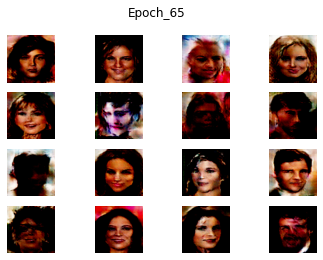

epoch -> [67/150], discriminator_loss_for_real_data = 118.27, discriminator_loss_for_fake_data = 121.67, generator_loss = 573.24



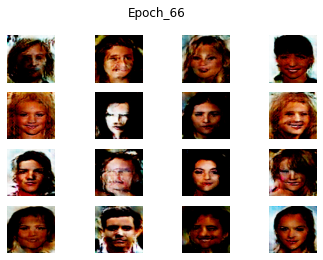

epoch -> [68/150], discriminator_loss_for_real_data = 112.08, discriminator_loss_for_fake_data = 117.60, generator_loss = 617.28



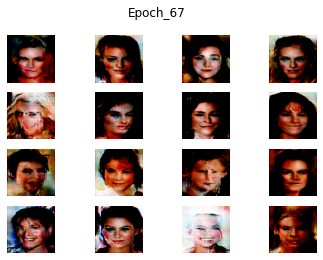

epoch -> [69/150], discriminator_loss_for_real_data = 114.16, discriminator_loss_for_fake_data = 115.51, generator_loss = 615.25



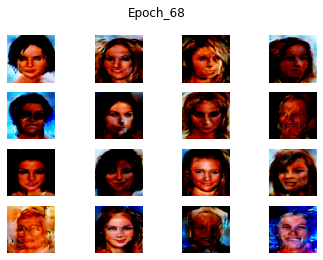

epoch -> [70/150], discriminator_loss_for_real_data = 110.22, discriminator_loss_for_fake_data = 114.08, generator_loss = 622.65



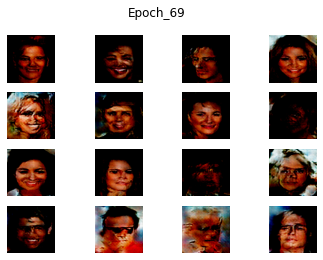

epoch -> [71/150], discriminator_loss_for_real_data = 107.71, discriminator_loss_for_fake_data = 116.71, generator_loss = 605.17



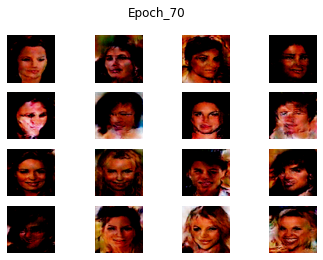

epoch -> [72/150], discriminator_loss_for_real_data = 111.77, discriminator_loss_for_fake_data = 115.24, generator_loss = 620.47



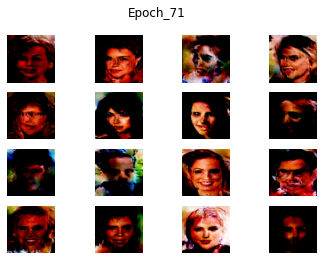

epoch -> [73/150], discriminator_loss_for_real_data = 111.92, discriminator_loss_for_fake_data = 112.41, generator_loss = 635.87



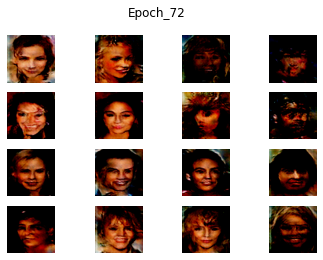

epoch -> [74/150], discriminator_loss_for_real_data = 106.76, discriminator_loss_for_fake_data = 110.09, generator_loss = 641.44



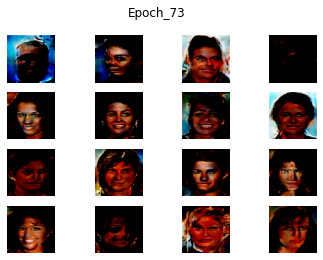

epoch -> [75/150], discriminator_loss_for_real_data = 102.65, discriminator_loss_for_fake_data = 111.58, generator_loss = 649.53



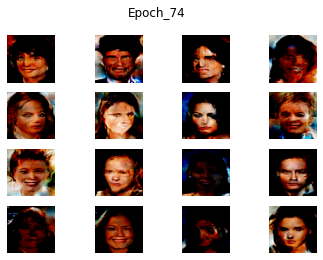

epoch -> [76/150], discriminator_loss_for_real_data = 103.02, discriminator_loss_for_fake_data = 107.89, generator_loss = 682.45



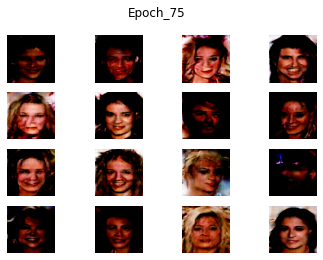

epoch -> [77/150], discriminator_loss_for_real_data = 102.16, discriminator_loss_for_fake_data = 105.53, generator_loss = 676.29



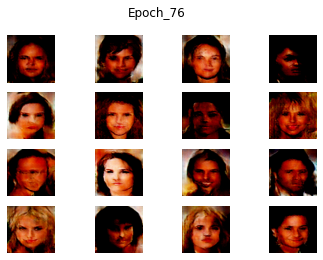

epoch -> [78/150], discriminator_loss_for_real_data = 100.54, discriminator_loss_for_fake_data = 102.40, generator_loss = 696.89



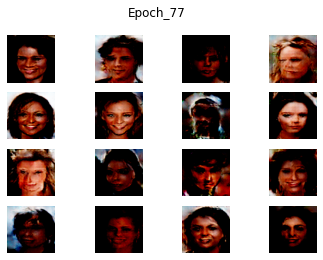

epoch -> [79/150], discriminator_loss_for_real_data = 96.22, discriminator_loss_for_fake_data = 99.41, generator_loss = 694.42



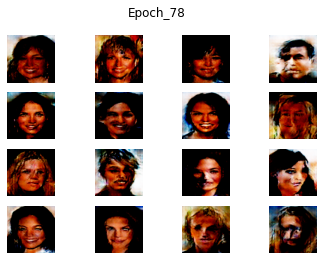

epoch -> [80/150], discriminator_loss_for_real_data = 96.70, discriminator_loss_for_fake_data = 102.87, generator_loss = 707.23



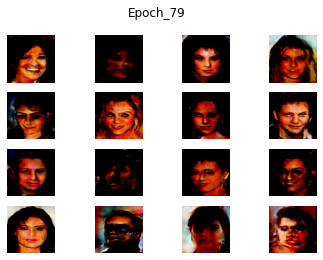

epoch -> [81/150], discriminator_loss_for_real_data = 96.70, discriminator_loss_for_fake_data = 101.15, generator_loss = 718.53



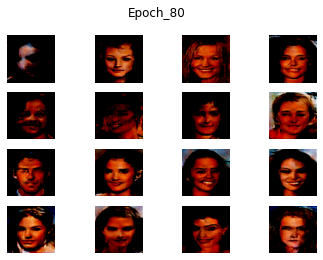

epoch -> [82/150], discriminator_loss_for_real_data = 97.52, discriminator_loss_for_fake_data = 104.01, generator_loss = 703.64



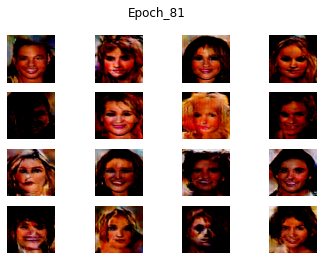

epoch -> [83/150], discriminator_loss_for_real_data = 90.87, discriminator_loss_for_fake_data = 94.82, generator_loss = 733.41



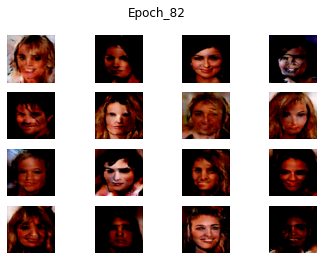

epoch -> [84/150], discriminator_loss_for_real_data = 97.42, discriminator_loss_for_fake_data = 107.60, generator_loss = 707.97



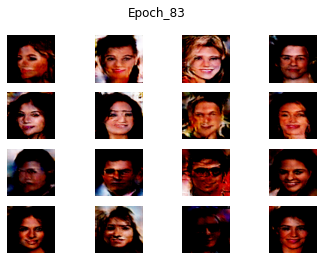

epoch -> [85/150], discriminator_loss_for_real_data = 94.05, discriminator_loss_for_fake_data = 100.95, generator_loss = 714.04



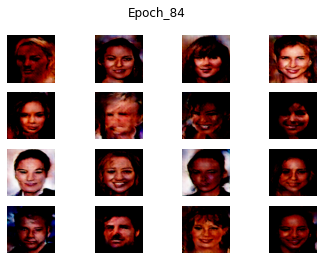

epoch -> [86/150], discriminator_loss_for_real_data = 91.93, discriminator_loss_for_fake_data = 99.96, generator_loss = 750.62



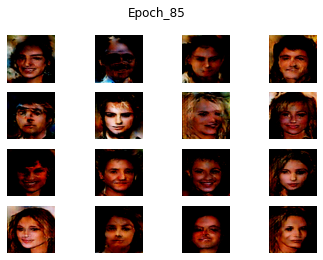

epoch -> [87/150], discriminator_loss_for_real_data = 92.56, discriminator_loss_for_fake_data = 96.99, generator_loss = 759.85



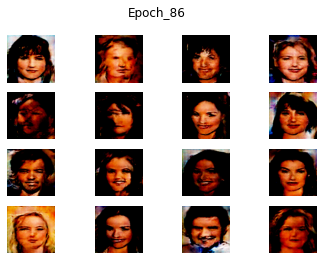

epoch -> [88/150], discriminator_loss_for_real_data = 94.62, discriminator_loss_for_fake_data = 94.54, generator_loss = 777.21



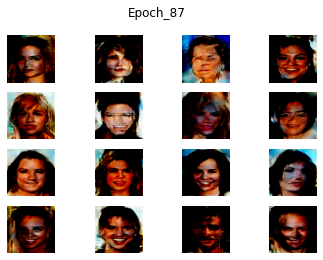

epoch -> [89/150], discriminator_loss_for_real_data = 90.97, discriminator_loss_for_fake_data = 96.17, generator_loss = 772.90



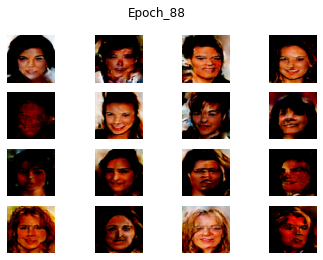

epoch -> [90/150], discriminator_loss_for_real_data = 89.89, discriminator_loss_for_fake_data = 98.43, generator_loss = 760.37



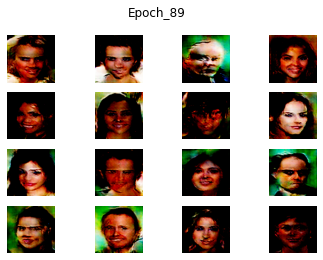

epoch -> [91/150], discriminator_loss_for_real_data = 87.76, discriminator_loss_for_fake_data = 92.84, generator_loss = 769.76



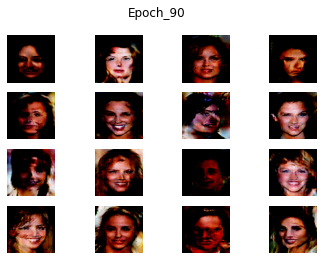

epoch -> [92/150], discriminator_loss_for_real_data = 84.32, discriminator_loss_for_fake_data = 90.90, generator_loss = 788.69



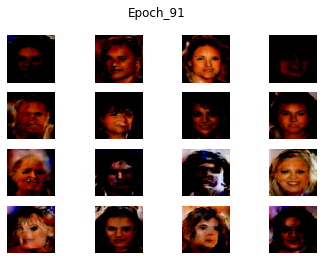

epoch -> [93/150], discriminator_loss_for_real_data = 89.39, discriminator_loss_for_fake_data = 98.16, generator_loss = 779.56



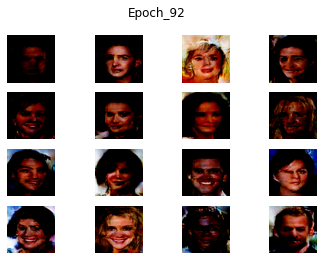

epoch -> [94/150], discriminator_loss_for_real_data = 83.05, discriminator_loss_for_fake_data = 89.97, generator_loss = 785.82



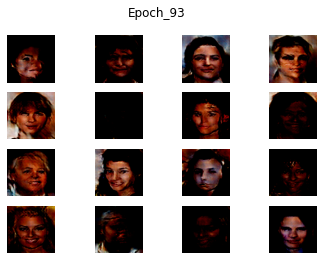

epoch -> [95/150], discriminator_loss_for_real_data = 90.29, discriminator_loss_for_fake_data = 99.95, generator_loss = 791.70



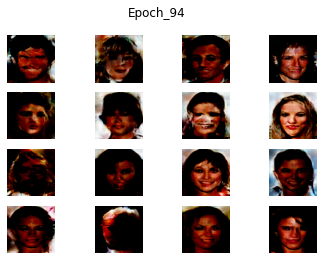

epoch -> [96/150], discriminator_loss_for_real_data = 85.38, discriminator_loss_for_fake_data = 93.00, generator_loss = 803.63



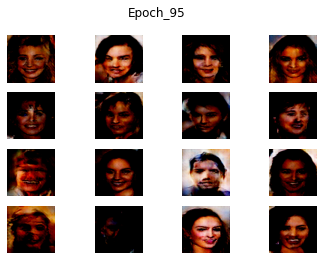

epoch -> [97/150], discriminator_loss_for_real_data = 86.99, discriminator_loss_for_fake_data = 95.90, generator_loss = 791.90



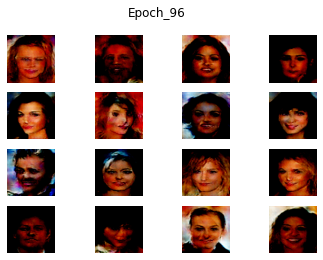

epoch -> [98/150], discriminator_loss_for_real_data = 84.86, discriminator_loss_for_fake_data = 92.43, generator_loss = 789.02



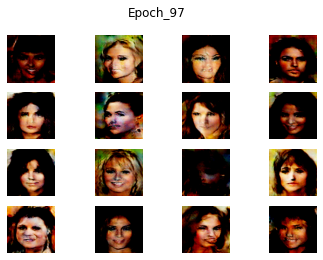

epoch -> [99/150], discriminator_loss_for_real_data = 80.82, discriminator_loss_for_fake_data = 88.23, generator_loss = 826.78



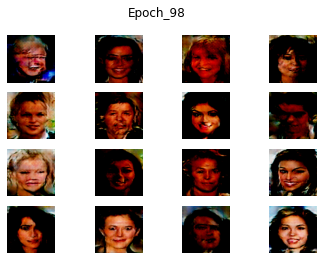

epoch -> [100/150], discriminator_loss_for_real_data = 86.20, discriminator_loss_for_fake_data = 93.70, generator_loss = 801.48



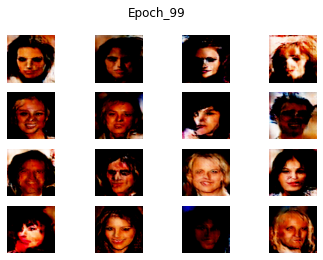

epoch -> [101/150], discriminator_loss_for_real_data = 77.97, discriminator_loss_for_fake_data = 86.59, generator_loss = 845.33



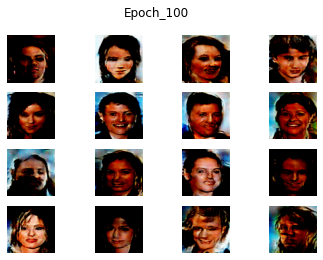

epoch -> [102/150], discriminator_loss_for_real_data = 83.57, discriminator_loss_for_fake_data = 87.89, generator_loss = 844.96



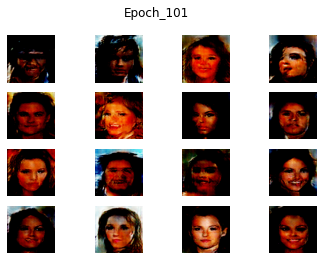

epoch -> [103/150], discriminator_loss_for_real_data = 80.11, discriminator_loss_for_fake_data = 92.36, generator_loss = 843.62



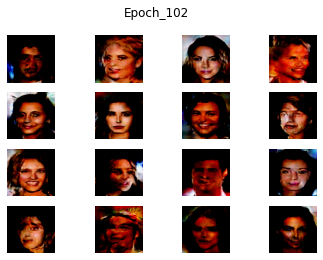

epoch -> [104/150], discriminator_loss_for_real_data = 79.32, discriminator_loss_for_fake_data = 85.98, generator_loss = 845.87



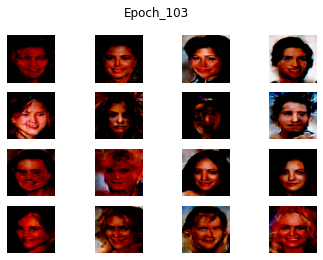

epoch -> [105/150], discriminator_loss_for_real_data = 72.93, discriminator_loss_for_fake_data = 80.84, generator_loss = 889.20



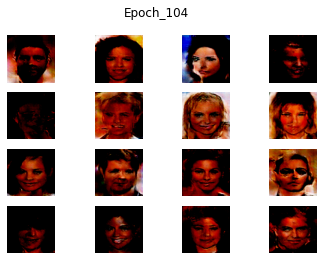

epoch -> [106/150], discriminator_loss_for_real_data = 82.39, discriminator_loss_for_fake_data = 92.25, generator_loss = 829.92



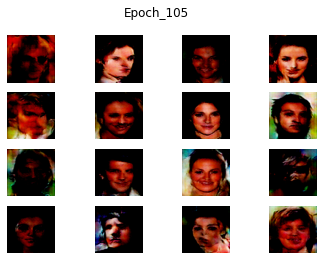

epoch -> [107/150], discriminator_loss_for_real_data = 79.52, discriminator_loss_for_fake_data = 86.89, generator_loss = 861.34



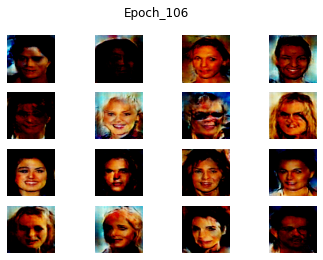

epoch -> [108/150], discriminator_loss_for_real_data = 77.77, discriminator_loss_for_fake_data = 87.33, generator_loss = 866.38



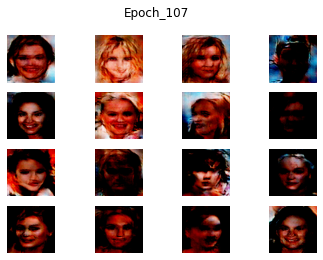

epoch -> [109/150], discriminator_loss_for_real_data = 75.37, discriminator_loss_for_fake_data = 84.41, generator_loss = 859.67



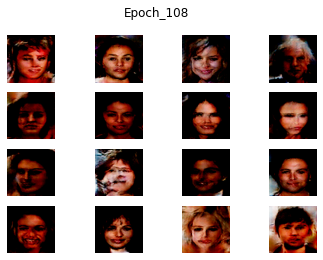

epoch -> [110/150], discriminator_loss_for_real_data = 79.15, discriminator_loss_for_fake_data = 89.79, generator_loss = 882.78



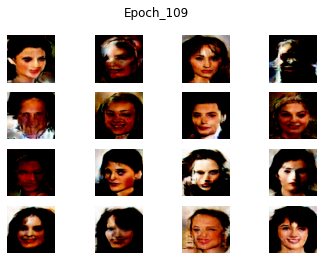

epoch -> [111/150], discriminator_loss_for_real_data = 76.88, discriminator_loss_for_fake_data = 84.11, generator_loss = 884.71



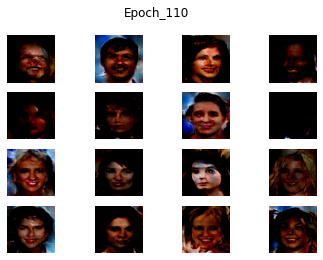

epoch -> [112/150], discriminator_loss_for_real_data = 77.51, discriminator_loss_for_fake_data = 82.82, generator_loss = 886.11



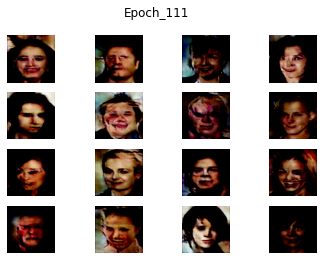

epoch -> [113/150], discriminator_loss_for_real_data = 79.84, discriminator_loss_for_fake_data = 86.78, generator_loss = 874.16



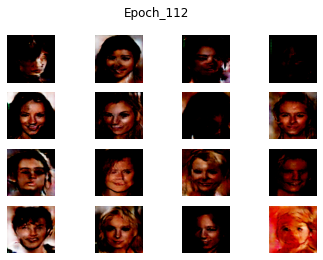

epoch -> [114/150], discriminator_loss_for_real_data = 77.34, discriminator_loss_for_fake_data = 85.04, generator_loss = 861.34



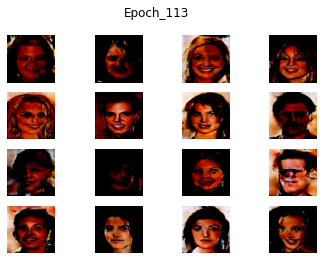

epoch -> [115/150], discriminator_loss_for_real_data = 70.17, discriminator_loss_for_fake_data = 76.82, generator_loss = 925.67



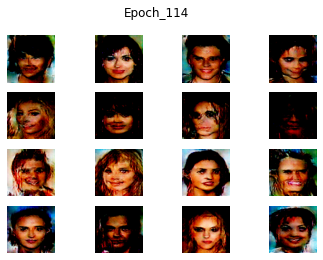

epoch -> [116/150], discriminator_loss_for_real_data = 68.90, discriminator_loss_for_fake_data = 79.24, generator_loss = 929.99



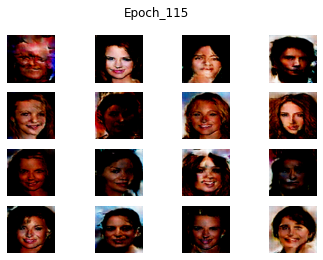

epoch -> [117/150], discriminator_loss_for_real_data = 71.02, discriminator_loss_for_fake_data = 76.92, generator_loss = 959.42



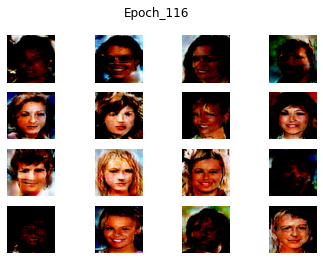

epoch -> [118/150], discriminator_loss_for_real_data = 72.96, discriminator_loss_for_fake_data = 79.74, generator_loss = 917.75



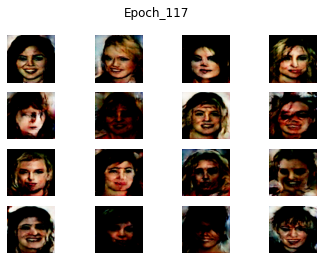

epoch -> [119/150], discriminator_loss_for_real_data = 70.73, discriminator_loss_for_fake_data = 81.41, generator_loss = 930.84



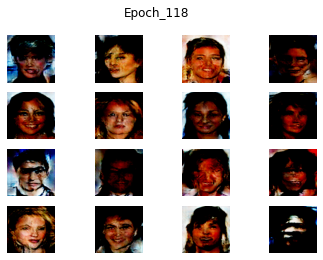

epoch -> [120/150], discriminator_loss_for_real_data = 69.84, discriminator_loss_for_fake_data = 75.50, generator_loss = 932.68



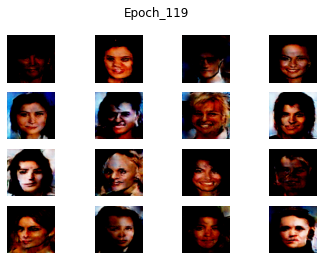

epoch -> [121/150], discriminator_loss_for_real_data = 73.45, discriminator_loss_for_fake_data = 82.50, generator_loss = 916.68



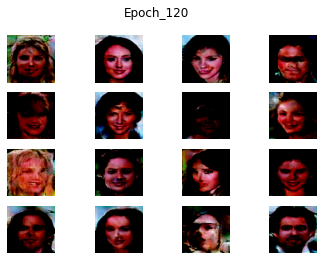

epoch -> [122/150], discriminator_loss_for_real_data = 71.22, discriminator_loss_for_fake_data = 81.46, generator_loss = 939.89



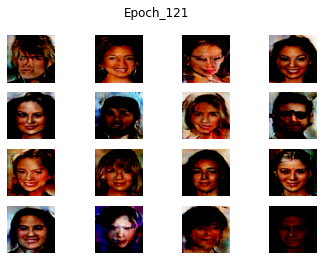

epoch -> [123/150], discriminator_loss_for_real_data = 72.33, discriminator_loss_for_fake_data = 79.82, generator_loss = 925.56



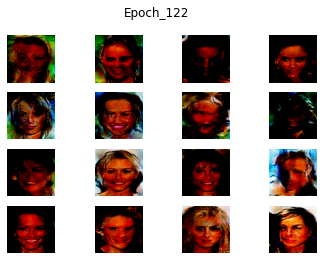

epoch -> [124/150], discriminator_loss_for_real_data = 73.40, discriminator_loss_for_fake_data = 80.70, generator_loss = 932.86



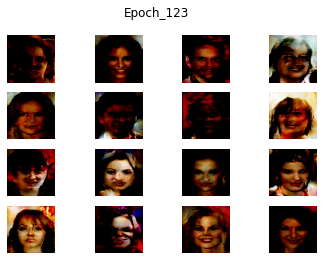

epoch -> [125/150], discriminator_loss_for_real_data = 68.31, discriminator_loss_for_fake_data = 78.74, generator_loss = 934.69



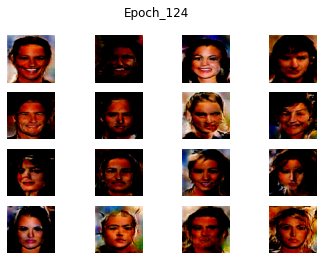

epoch -> [126/150], discriminator_loss_for_real_data = 72.84, discriminator_loss_for_fake_data = 80.99, generator_loss = 966.90



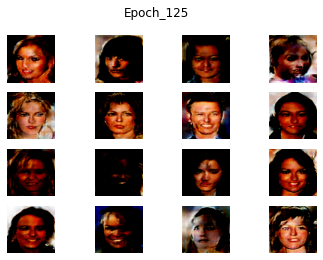

epoch -> [127/150], discriminator_loss_for_real_data = 64.58, discriminator_loss_for_fake_data = 75.87, generator_loss = 952.80



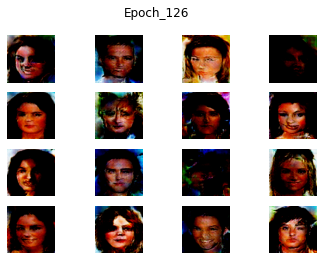

epoch -> [128/150], discriminator_loss_for_real_data = 71.70, discriminator_loss_for_fake_data = 76.74, generator_loss = 947.80



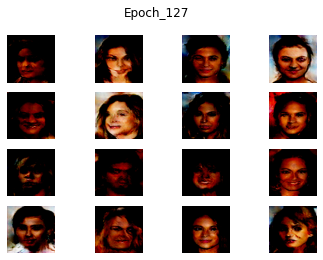

epoch -> [129/150], discriminator_loss_for_real_data = 69.85, discriminator_loss_for_fake_data = 77.91, generator_loss = 938.19



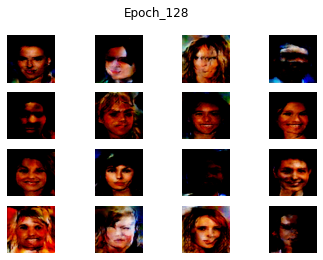

epoch -> [130/150], discriminator_loss_for_real_data = 66.20, discriminator_loss_for_fake_data = 74.78, generator_loss = 960.59



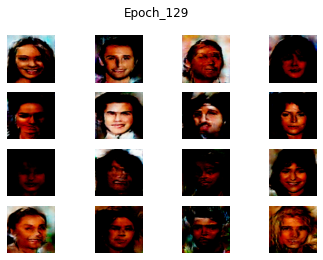

epoch -> [131/150], discriminator_loss_for_real_data = 67.69, discriminator_loss_for_fake_data = 73.86, generator_loss = 980.38



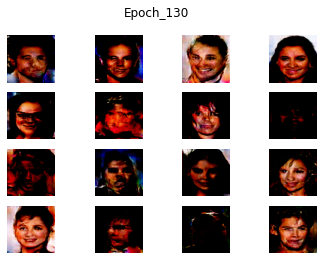

epoch -> [132/150], discriminator_loss_for_real_data = 64.21, discriminator_loss_for_fake_data = 73.79, generator_loss = 993.09



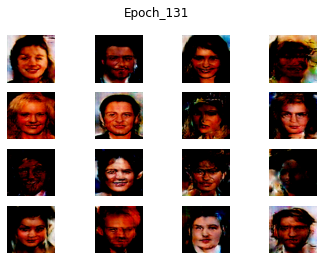

epoch -> [133/150], discriminator_loss_for_real_data = 69.95, discriminator_loss_for_fake_data = 78.63, generator_loss = 986.62



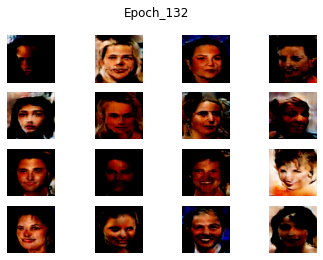

epoch -> [134/150], discriminator_loss_for_real_data = 65.34, discriminator_loss_for_fake_data = 77.07, generator_loss = 974.71



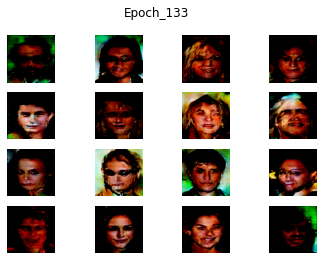

epoch -> [135/150], discriminator_loss_for_real_data = 68.27, discriminator_loss_for_fake_data = 72.89, generator_loss = 979.80



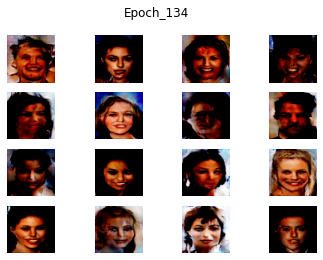

epoch -> [136/150], discriminator_loss_for_real_data = 62.71, discriminator_loss_for_fake_data = 68.70, generator_loss = 1013.57



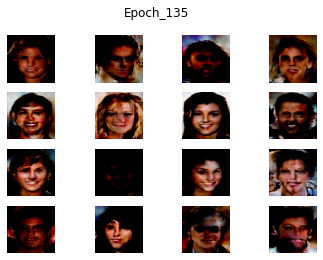

epoch -> [137/150], discriminator_loss_for_real_data = 61.61, discriminator_loss_for_fake_data = 68.49, generator_loss = 1039.58



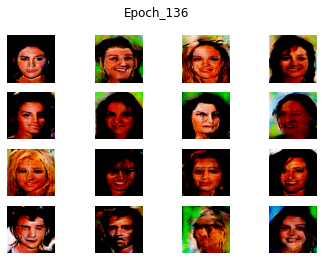

epoch -> [138/150], discriminator_loss_for_real_data = 59.69, discriminator_loss_for_fake_data = 70.56, generator_loss = 1029.27



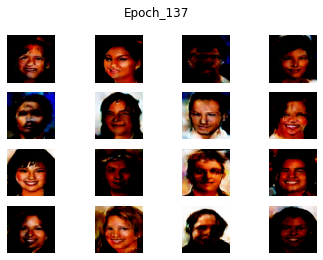

epoch -> [139/150], discriminator_loss_for_real_data = 66.41, discriminator_loss_for_fake_data = 74.58, generator_loss = 1002.26



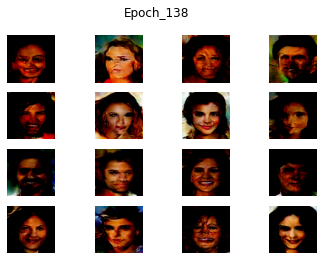

epoch -> [140/150], discriminator_loss_for_real_data = 65.14, discriminator_loss_for_fake_data = 74.71, generator_loss = 1019.32



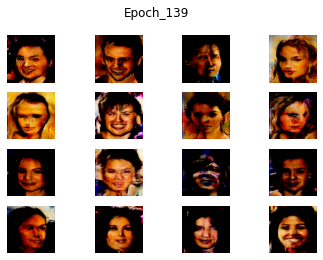

epoch -> [141/150], discriminator_loss_for_real_data = 63.67, discriminator_loss_for_fake_data = 70.82, generator_loss = 1021.96



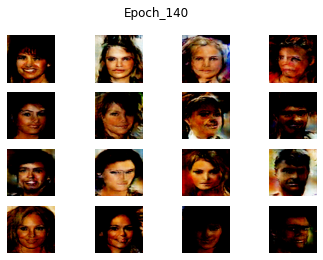

epoch -> [142/150], discriminator_loss_for_real_data = 61.59, discriminator_loss_for_fake_data = 69.51, generator_loss = 1035.90



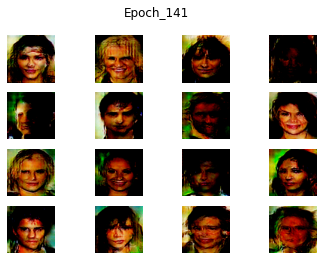

epoch -> [143/150], discriminator_loss_for_real_data = 64.71, discriminator_loss_for_fake_data = 75.36, generator_loss = 1038.36



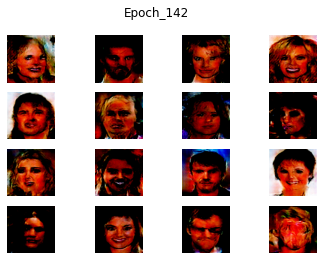

epoch -> [144/150], discriminator_loss_for_real_data = 61.89, discriminator_loss_for_fake_data = 70.36, generator_loss = 1010.22



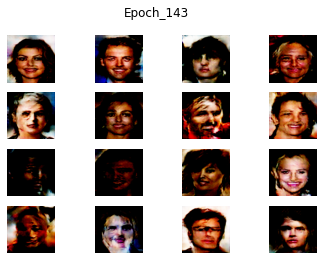

epoch -> [145/150], discriminator_loss_for_real_data = 64.64, discriminator_loss_for_fake_data = 69.49, generator_loss = 1032.47



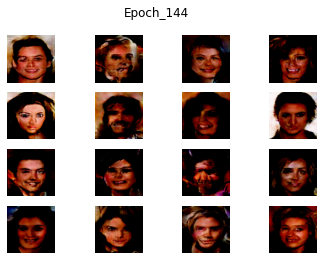

epoch -> [146/150], discriminator_loss_for_real_data = 64.52, discriminator_loss_for_fake_data = 72.27, generator_loss = 1049.74



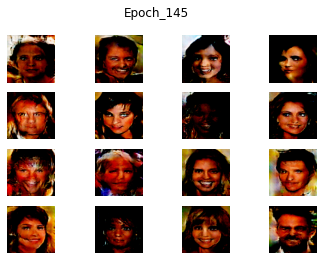

epoch -> [147/150], discriminator_loss_for_real_data = 61.15, discriminator_loss_for_fake_data = 66.78, generator_loss = 1035.74



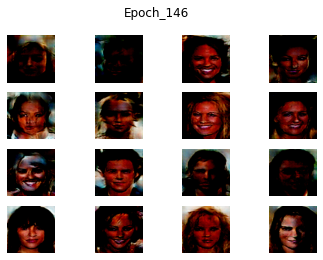

epoch -> [148/150], discriminator_loss_for_real_data = 66.17, discriminator_loss_for_fake_data = 72.40, generator_loss = 1002.34



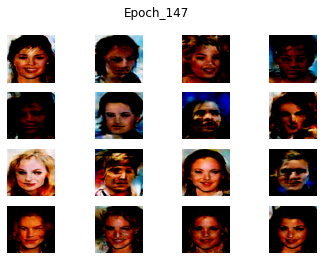

epoch -> [149/150], discriminator_loss_for_real_data = 63.68, discriminator_loss_for_fake_data = 72.21, generator_loss = 1026.50



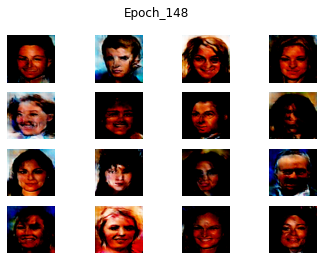

epoch -> [150/150], discriminator_loss_for_real_data = 60.13, discriminator_loss_for_fake_data = 72.78, generator_loss = 1035.98



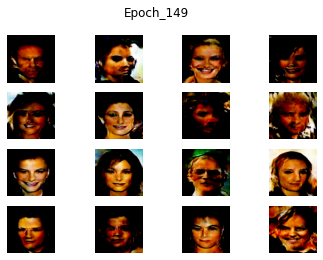

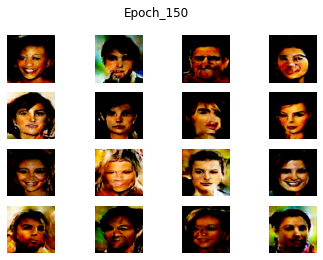

In [ ]:
with tf.device(device_name):

  latent_dim = 512
  n_epochs = 150
  n_batch = 32
  d_model = define_discriminator()
  g_model = define_generator(latent_dim)
  gan_model = define_gan(g_model, d_model)
  dataset = load_real_samples()
  print('\nREADY TO GO !!!\n')
  
  d_loss_real_array, d_loss_fake_array, g_loss_array = train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs, n_batch)

## Plot Loss Values

In [ ]:
# g_model.save("/content/sample_data/generator_model_c_dcgan.h5")

In [ ]:
loaded = np.load('/content/drive/MyDrive/GAN_New_Approch/1/loss_record_2.npz')
print(loaded['a'].shape)
print(loaded['b'].shape)

(150,)
(150,)


In [ ]:
import matplotlib.pyplot as plot

d_loss = np.array(loaded['a'])
g_loss = np.array(loaded['b'])

In [ ]:
d_loss = np.array([(i+j) for i,j in zip(d_loss_real_array, d_loss_fake_array)])

In [ ]:
g_loss = g_loss_array

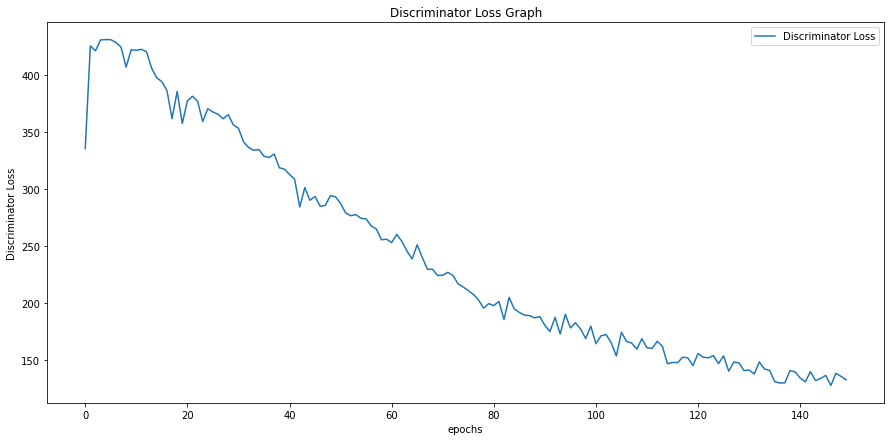

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(d_loss)
plt.title('Discriminator Loss Graph')
plt.ylabel('Discriminator Loss')
plt.xlabel('epochs')
plt.legend(["Discriminator Loss"], loc='upper right')
plt.show()

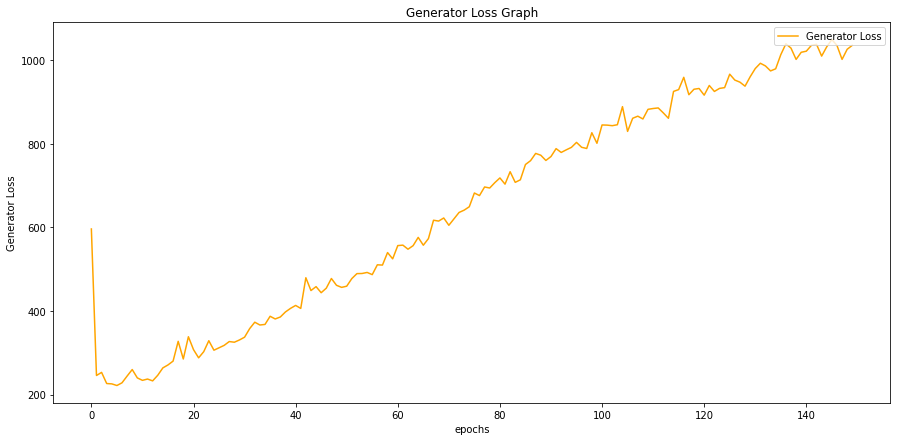

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(g_loss,color='orange')
plt.title('Generator Loss Graph')
plt.ylabel('Generator Loss')
plt.xlabel('epochs')
plt.legend(["Generator Loss"], loc='upper right')
plt.show()

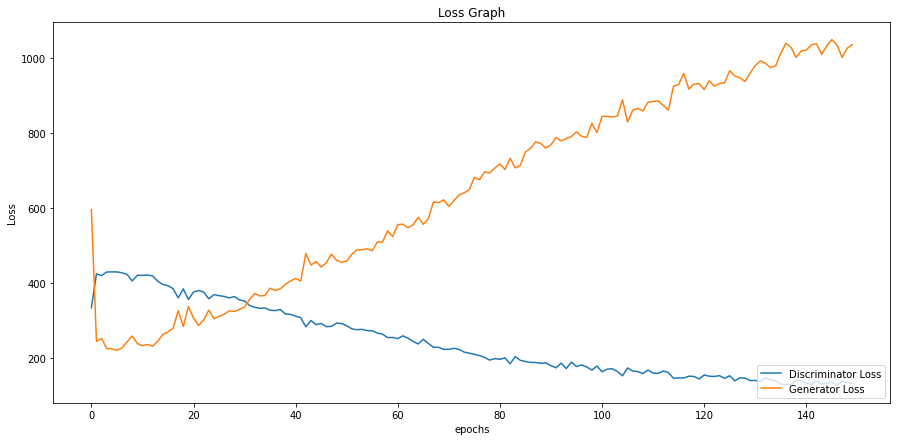

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(d_loss)
plt.plot(g_loss)
plt.title('Loss Graph')
plt.ylabel('Loss')
plt.xlabel('epochs')
plt.legend(["Discriminator Loss", "Generator Loss"], loc='lower right')
plt.show()

# Prediction

In [ ]:
generator = tensorflow.keras.models.load_model("/content/drive/MyDrive/GAN_New_Approch/1/generator_model_2.h5")

latent points(latent points and labels):  (16, 512) (16,)



Generated images with labels:  (16, 128, 128, 3) 



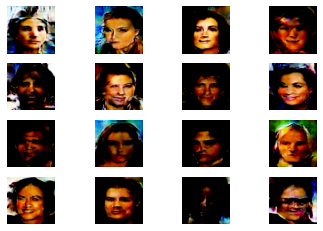

In [ ]:
latent_dim = 512
n_samples = 16
z_input, labels = generate_latent_points(latent_dim, n_samples)
print("latent points(latent points and labels): ",z_input.shape, labels.shape)
data = [z_input,labels]
pred = generator.predict(data)
# pred = (pred +1 ) / 2.0
print("\nGenerated images with labels: ",pred.shape,'\n')
save_plot(pred,n=4)

                                              -:END:-